<div class="alert alert-block alert-warning">
<b><center>SPCS Machine Learning Project</b>
</div>

<div class="alert alert-block alert-success">
<b><center>Predicting Students' Dropout and Academic Success</b>
</div>

<div class="alert alert-block alert-warning">
<b><center>Divvyam Arora</b>
</div>

<div class="alert alert-block alert-info">
<b>Source</b>
</div>

 https://archive.ics.uci.edu/dataset/697/predict+students+dropout+and+academic+success
 
### *Note - The dataset was edited to make the output binary (Graduate [1], Dropout [0]). It initally had another outcome called 'Enrolled' too.* 

<div class="alert alert-block alert-info">
<b>Credits</b>
</div>

- Dataset
     - Valentim Realinho
vrealinho@ipportalegre.pt
     -Mónica Vieira Martins
      mvmartins@ipportalegre.pt
     -Jorge Machado
      jmachado@ipportalegre.pt
     -Luís Baptista
      lmtb@ipportalegre.pt 

- Code
     - Dr. Jamie Fairclough
       jfair1@stanford.edu

<div class="alert alert-block alert-info">
<b>Dataset Description</b>
</div>

"This dataset is created from a higher education institution (acquired from several disjoint databases) related to students enrolled in different undergraduate degrees, such as agronomy, design, education, nursing, journalism, management, social service, and technologies. The dataset includes information known at the time of student enrollment (academic path, demographics, and social-economic factors) and the students' academic performance at the end of the first and second semesters. The data is used to build classification models to predict students' dropout and academic sucess. The problem is formulated as a three category classification task, in which there is a strong imbalance towards one of the classes."

<div class="alert alert-block alert-info">
<b>Initial Variables (n=36)</b>
</div>

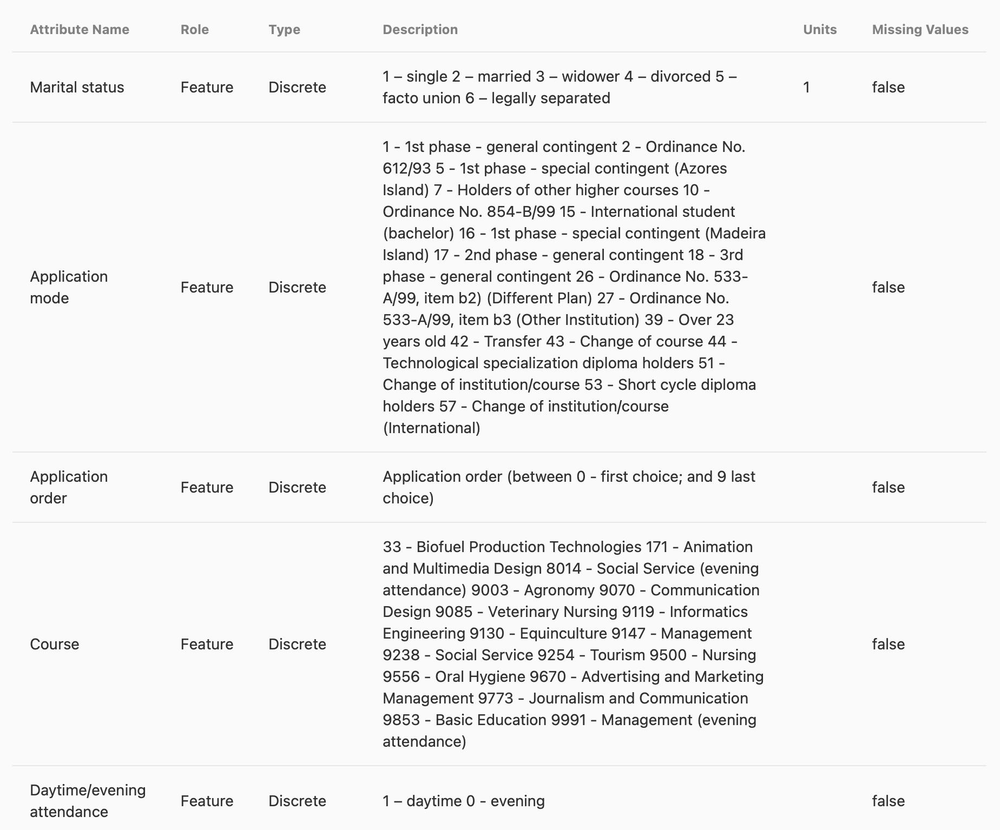

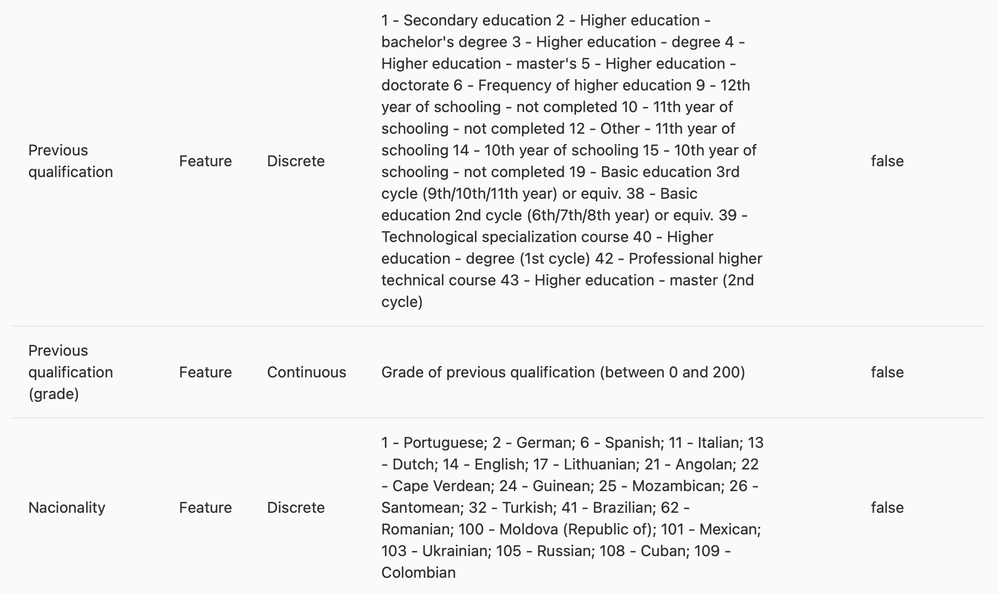

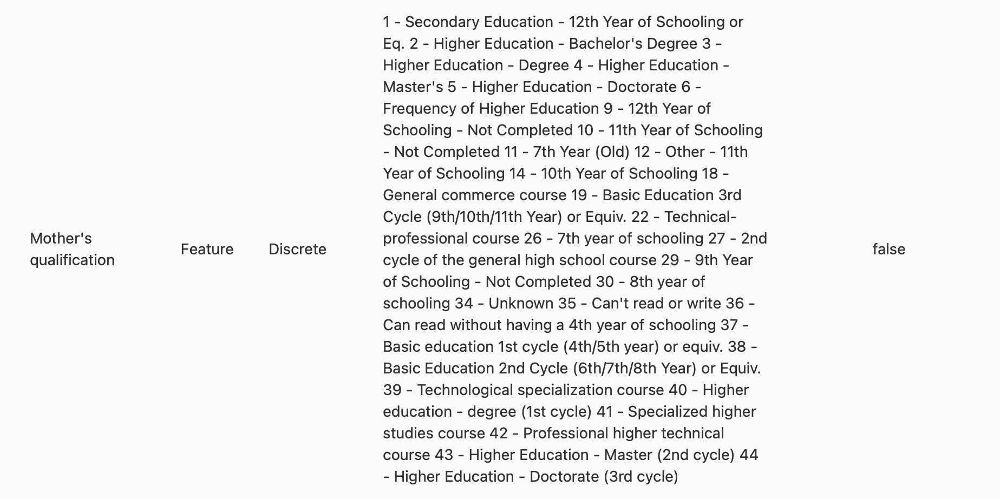

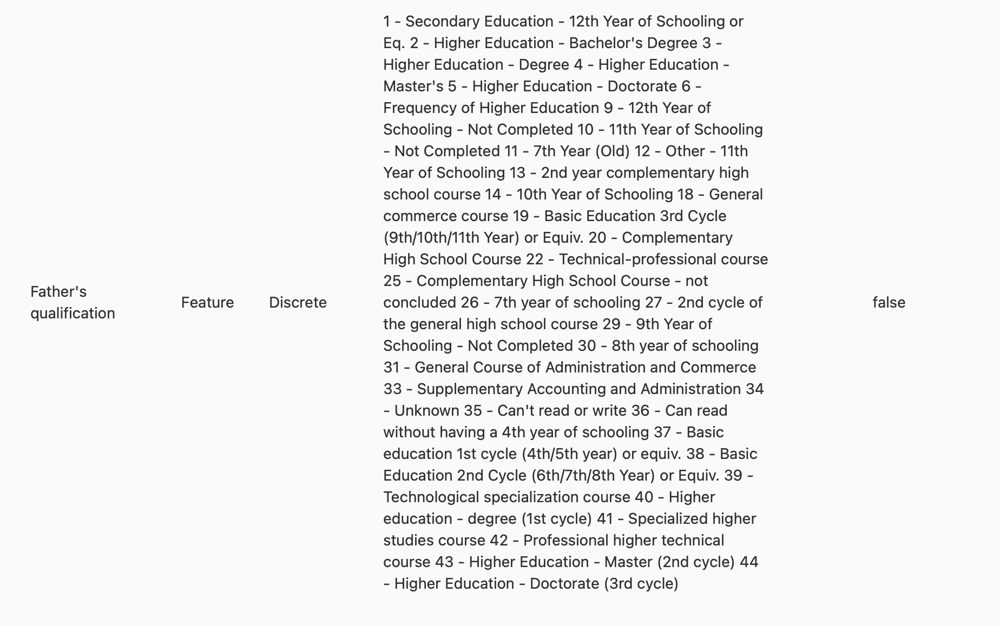

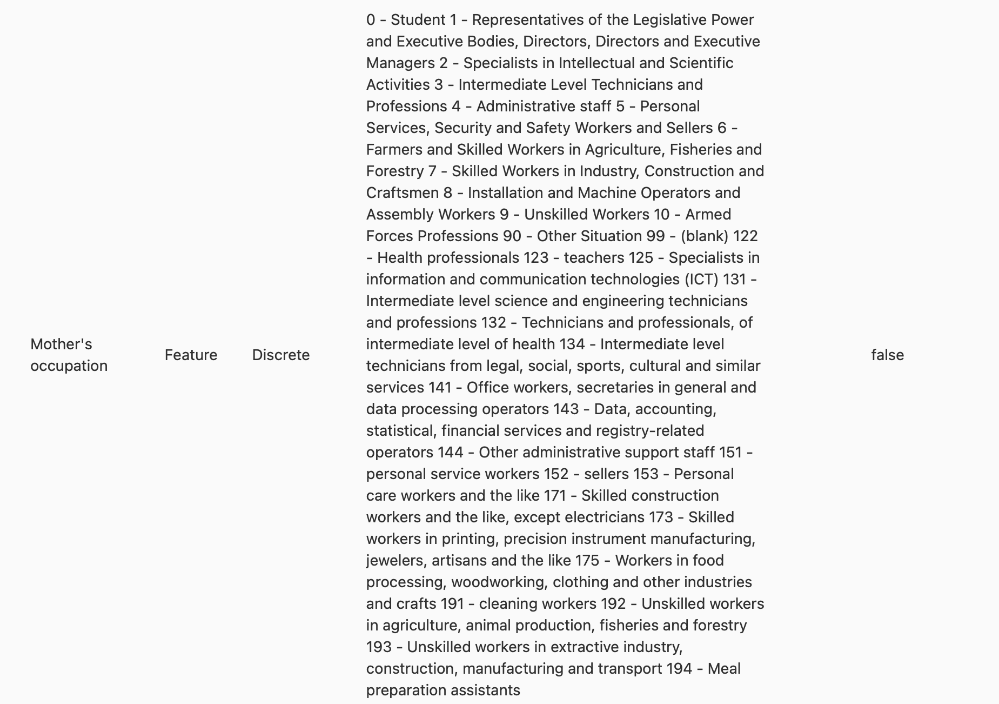

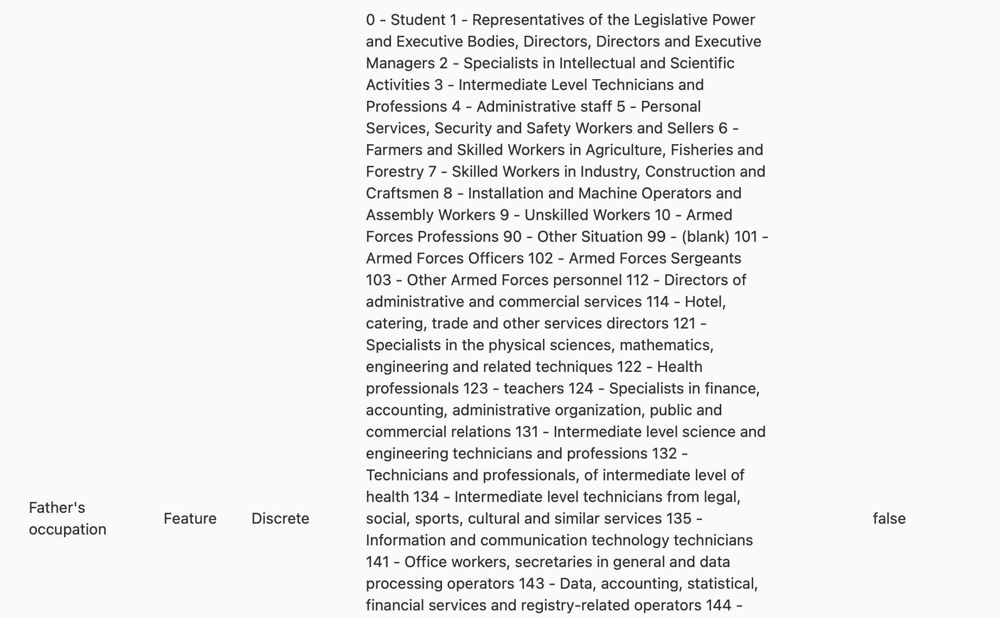

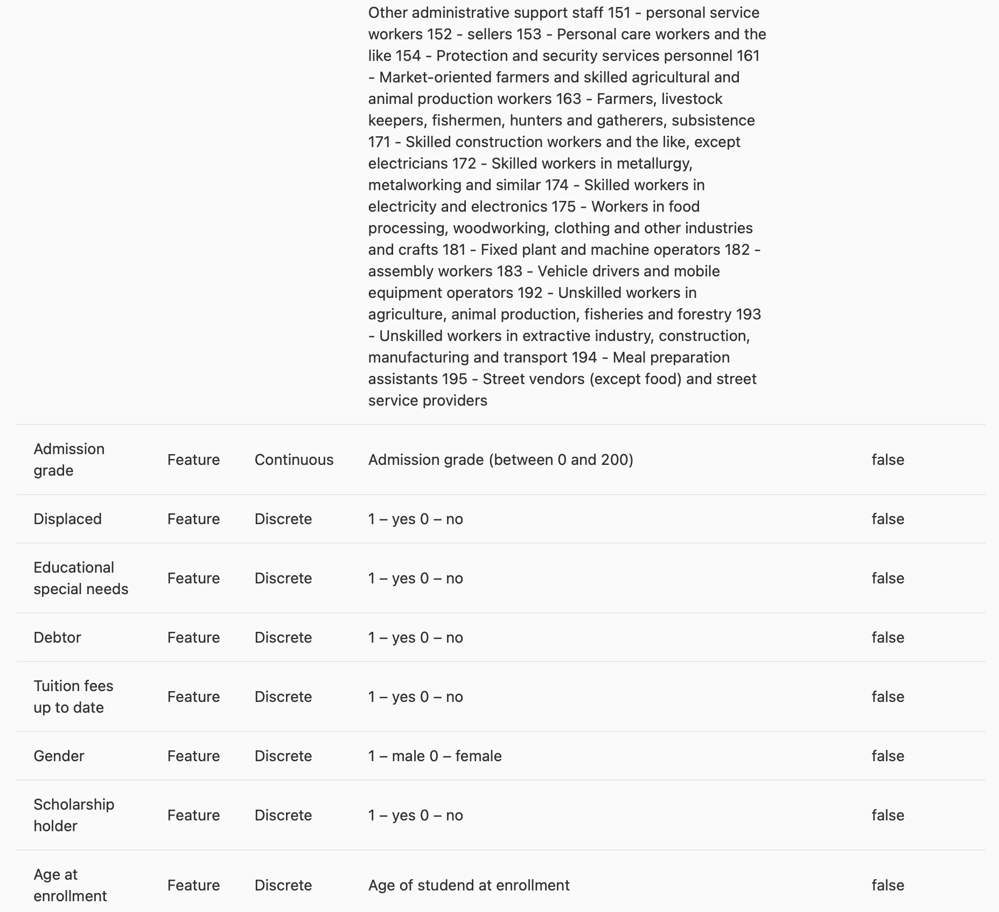

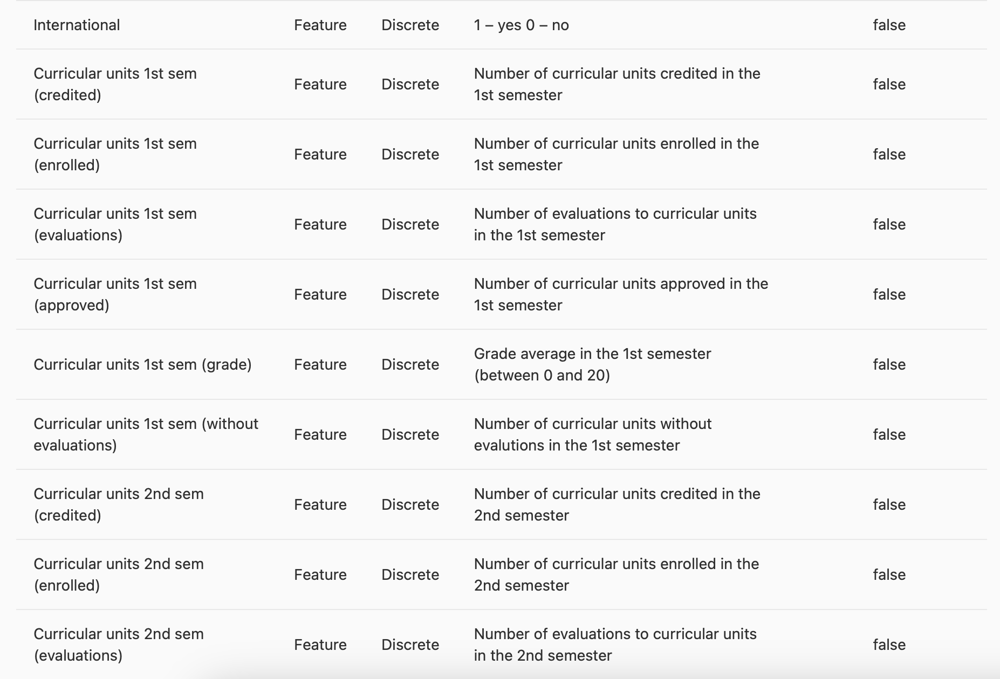

 Image Source: https://archive.ics.uci.edu/dataset/697/predict+students+dropout+and+academic+success

<div class="alert alert-block alert-info">
<b>Importing All Libraries</b>
</div>

In [78]:
# General Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import scipy.stats as stats
from scipy.stats import skew, norm, probplot, boxcox, f_oneway
import warnings
warnings.filterwarnings("ignore")
! pip install phik
import phik
from phik import resources, report
from sklearn.model_selection import train_test_split
import scipy.stats as stats
from scipy.stats import stats, norm, skew
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn import linear_model
from sklearn import metrics
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn import metrics
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from phik.report import plot_correlation_matrix
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score


# Libraries for different classifiers
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree

# Libraries for model tuning and evaluation metrics
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score
from sklearn.model_selection import GridSearchCV
from datetime import datetime
!pip install xgboost
from xgboost import XGBClassifier

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


<div class="alert alert-block alert-info">
<b>Reading Dataset</b>
</div>

In [79]:
df = pd.read_csv('data.csv')
df.shape

(3630, 37)

<div class="alert alert-block alert-info">
<b>Fixing Datatypes</b>
</div>

In [80]:
df['Marital status'] = df['Marital status'].astype('category')
df['Application mode'] = df['Application mode'].astype('category')
df['Application order'] = df['Application order'].astype('category')
df['Course'] = df['Course'].astype('category')
df['Previous qualification'] = df['Previous qualification'].astype('category')
df['Previous qualification (grade)'] = df['Previous qualification (grade)'].astype('float')
df['Nacionality'] = df['Nacionality'].astype('category')
df["Mother's qualification"] = df["Mother's qualification"].astype('category')
df["Father's qualification"] = df["Father's qualification"].astype('category')
df["Mother's occupation"] = df["Mother's qualification"].astype('category')
df["Father's occupation"] = df["Father's qualification"].astype('category')
df['Admission grade'] = df['Admission grade'].astype('int64')
df["Displaced"] = df["Displaced"].astype('category')
df["Educational special needs"] = df["Educational special needs"].astype('category')
df["Debtor"] = df["Debtor"].astype('category')
df["Tuition fees up to date"] = df["Tuition fees up to date"].astype('category')
df["Gender"] = df["Gender"].astype('category')
df["Scholarship holder"] = df["Scholarship holder"].astype('category')
df['Age at enrollment'] = df['Age at enrollment'].astype('int64')
df["International"] = df["International"].astype('category')
df["Unemployment rate"] = df["Unemployment rate"].astype('float')
df["Inflation rate"] = df["Inflation rate"].astype('float')
df["GDP"] = df["GDP"].astype('float')
df["Target"] = df["Target"].astype('category')
df['Curricular units 1st sem (credited)'] = df["Curricular units 1st sem (credited)"].astype('float')
df['Curricular units 1st sem (enrolled)'] = df["Curricular units 1st sem (enrolled)"].astype('float')
df['Curricular units 1st sem (evaluations)'] = df["Curricular units 1st sem (evaluations)"].astype('float')
df['Curricular units 1st sem (approved)'] = df["Curricular units 1st sem (approved)"].astype('float')
df['Curricular units 1st sem (grade)'] = df["Curricular units 1st sem (grade)"].astype('float')
df['Curricular units 1st sem (without evaluations)'] = df["Curricular units 1st sem (without evaluations)"].astype('float')
df['Curricular units 2nd sem (credited)'] = df["Curricular units 2nd sem (credited)"].astype('float')
df['Curricular units 2nd sem (enrolled)'] = df["Curricular units 2nd sem (enrolled)"].astype('float')
df['Curricular units 2nd sem (evaluations)'] = df["Curricular units 2nd sem (evaluations)"].astype('float')
df['Curricular units 2nd sem (approved)'] = df["Curricular units 2nd sem (approved)"].astype('float')
df['Curricular units 2nd sem (grade)'] = df["Curricular units 2nd sem (grade)"].astype('float')
df['Curricular units 2nd sem (without evaluations)'] = df["Curricular units 2nd sem (without evaluations)"].astype('float')
df['Tuition fees up to date'] = df['Tuition fees up to date'].astype('int64')
df['Course'] = df['Course'].astype('int64')

In [81]:
# Standard Metrics
df.describe()

,Course,Daytime/evening attendance\t,Previous qualification (grade),Admission grade,Tuition fees up to date,Age at enrollment,Curricular units 1st sem (credited),Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),...,Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP
count,3630.000000,3630.000000,3630.000000,3630.000000,3630.000000,3630.000000,3630.000000,3630.000000,3630.000000,3630.000000,...,3630.000000,3630.000000,3630.000000,3630.000000,3630.000000,3630.000000,3630.000000,3630.000000,3630.000000,3630.000000
mean,8853.980992,0.887603,132.920606,126.957025,0.866116,23.461157,0.754270,6.337466,8.071074,4.791460,...,0.128926,0.581818,6.296419,7.763085,4.518457,10.036155,0.142149,11.630358,1.231598,-0.009256
std,2068.760082,0.315897,13.238373,14.609751,0.340575,7.827994,2.477277,2.570773,4.286632,3.237845,...,0.679111,2.022688,2.263020,3.964163,3.162376,5.481742,0.747670,2.667652,1.384911,2.259986
min,33.000000,0.000000,95.000000,95.000000,0.000000,17.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.600000,-0.800000,-4.060000
25%,9085.000000,1.000000,125.000000,118.000000,1.000000,19.000000,0.000000,5.000000,6.000000,3.000000,...,0.000000,0.000000,5.000000,6.000000,2.000000,10.517857,0.000000,9.400000,0.300000,-1.700000
50%,9254.000000,1.000000,133.100000,126.000000,1.000000,20.000000,0.000000,6.000000,8.000000,5.000000,...,0.000000,0.000000,6.000000,8.000000,5.000000,12.333333,0.000000,11.100000,1.400000,0.320000
75%,9556.000000,1.000000,140.000000,135.000000,1.000000,25.000000,0.000000,7.000000,10.000000,6.000000,...,0.000000,0.000000,7.000000,10.000000,6.000000,13.500000,0.000000,13.900000,2.600000,1.790000
max,9991.000000,1.000000,190.000000,190.000000,1.000000,70.000000,20.000000,26.000000,45.000000,26.000000,...,12.000000,19.000000,23.000000,33.000000,20.000000,18.571429,12.000000,16.200000,3.700000,3.510000


In [82]:
# Frequency of the different outcomes
df["Target"].value_counts()


Target
1    2209
0    1421
Name: count, dtype: int64

In [83]:
# Checking for duplicate values
df[df.duplicated()].count()

Marital status                                    0
Application mode                                  0
Application order                                 0
Course                                            0
Daytime/evening attendance\t                      0
Previous qualification                            0
Previous qualification (grade)                    0
Nacionality                                       0
Mother's qualification                            0
Father's qualification                            0
Mother's occupation                               0
Father's occupation                               0
Admission grade                                   0
Displaced                                         0
Educational special needs                         0
Debtor                                            0
Tuition fees up to date                           0
Gender                                            0
Scholarship holder                                0
Age at enrol

<div class="alert alert-block alert-info">
<b>Exploratory Data Analysis</b>
</div>

In [84]:
# phik correlation matrix
phik_overview = df.phik_matrix()
df.phik_matrix()
# Presenting Phi K data as a heatmap (credit: Jai Gupta)
plot_correlation_matrix(phik_overview.values, 
                        x_labels=phik_overview.columns, 
                        y_labels=phik_overview.index, 
                        vmin=0, vmax=1, color_map="coolwarm", 
                        title=r"correlation $\phi_K$", 
                        fontsize_factor=5, 
                        figsize=(100, 80))
plt.tight_layout()

interval columns not set, guessing: ['Course', 'Daytime/evening attendance\t', 'Previous qualification (grade)', 'Admission grade', 'Tuition fees up to date', 'Age at enrollment', 'Curricular units 1st sem (credited)', 'Curricular units 1st sem (enrolled)', 'Curricular units 1st sem (evaluations)', 'Curricular units 1st sem (approved)', 'Curricular units 1st sem (grade)', 'Curricular units 1st sem (without evaluations)', 'Curricular units 2nd sem (credited)', 'Curricular units 2nd sem (enrolled)', 'Curricular units 2nd sem (evaluations)', 'Curricular units 2nd sem (approved)', 'Curricular units 2nd sem (grade)', 'Curricular units 2nd sem (without evaluations)', 'Unemployment rate', 'Inflation rate', 'GDP']
interval columns not set, guessing: ['Course', 'Daytime/evening attendance\t', 'Previous qualification (grade)', 'Admission grade', 'Tuition fees up to date', 'Age at enrollment', 'Curricular units 1st sem (credited)', 'Curricular units 1st sem (enrolled)', 'Curricular units 1st sem 

### *Note - All the variables with a correlation of less than 0.4 with the final outcome were removed. Some of the variables with correlation of less than 0.4 were kept as per the recommendation of the dataset creators.*

In [85]:
# Removing Variables
df.pop('Age at enrollment')
df.pop('Application mode')
df.pop('Debtor')
df.pop('Gender')
df.pop('Curricular units 1st sem (without evaluations)')
df.pop('Curricular units 1st sem (credited)')
df.pop('Curricular units 1st sem (grade)')
df.pop('Curricular units 2nd sem (without evaluations)')
df.pop('Curricular units 2nd sem (enrolled)')
df.pop('Curricular units 2nd sem (evaluations)')
df.pop('Curricular units 2nd sem (credited)')
df.pop("Inflation rate")
df.pop('Unemployment rate')
df.pop('GDP')
df.pop('Application order')
df.pop('Marital status')
df.pop('Daytime/evening attendance\t')
df.pop('Previous qualification (grade)')
df.pop('Previous qualification')
df.pop("Mother's qualification")
df.pop("Mother's occupation")
df.pop("Father's occupation")            
df.pop("Father's qualification") 
df.pop('Nacionality')
df.pop('Displaced')
df.pop('Admission grade')
df.pop('International')
df.pop('Educational special needs')
df.pop('Scholarship holder')


0       0
1       0
2       0
3       0
4       0
       ..
3625    1
3626    0
3627    0
3628    1
3629    0
Name: Scholarship holder, Length: 3630, dtype: category
Categories (2, int64): [0, 1]

interval columns not set, guessing: ['Course', 'Tuition fees up to date', 'Curricular units 1st sem (enrolled)', 'Curricular units 1st sem (evaluations)', 'Curricular units 1st sem (approved)', 'Curricular units 2nd sem (approved)', 'Curricular units 2nd sem (grade)']
interval columns not set, guessing: ['Course', 'Tuition fees up to date', 'Curricular units 1st sem (enrolled)', 'Curricular units 1st sem (evaluations)', 'Curricular units 1st sem (approved)', 'Curricular units 2nd sem (approved)', 'Curricular units 2nd sem (grade)']


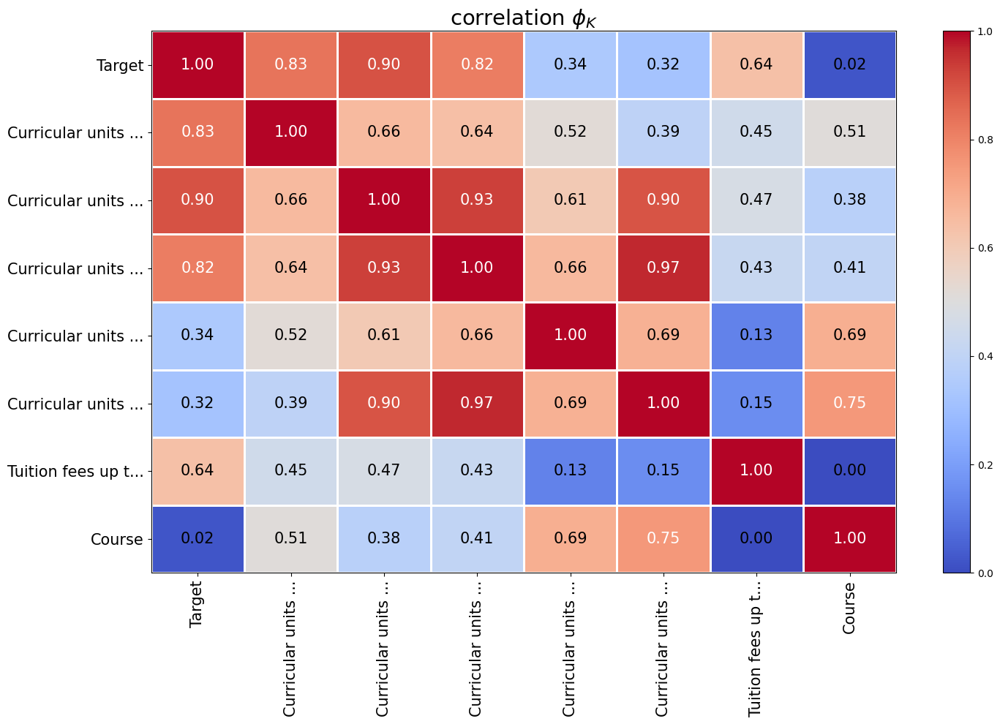

In [86]:
# updated phik correlation matrix
phik_overview = df.phik_matrix()
df.phik_matrix()
# Presenting Phi K data as a heatmap (credit: Jai Gupta)
plot_correlation_matrix(phik_overview.values, 
                        x_labels=phik_overview.columns, 
                        y_labels=phik_overview.index, 
                        vmin=0, vmax=1, color_map="coolwarm", 
                        title=r"correlation $\phi_K$", 
                        fontsize_factor=1.5, 
                        figsize=(15, 10))
plt.tight_layout()

<div class="alert alert-block alert-info">
<b>Plotting Histograms to Check the Distribution of Each Numeric Variable</b>
</div>

### *Note - This block of code was not used as there were issues in plotting due to variable names.

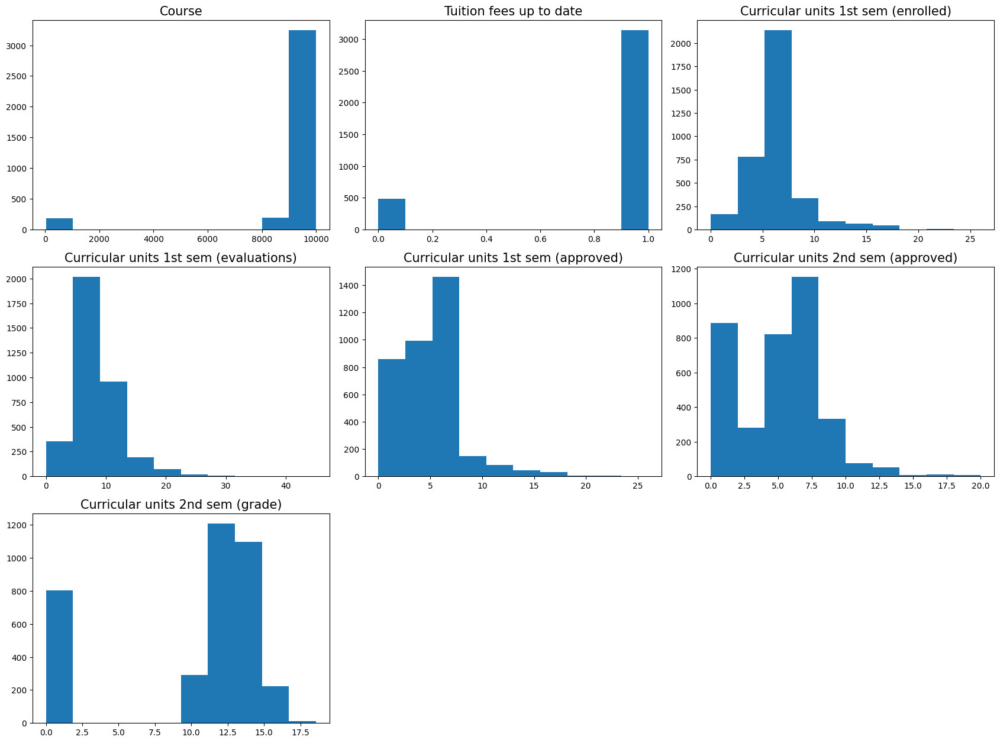

In [87]:

from scipy.stats import norm
all_col = df.select_dtypes(include=np.number).columns.tolist()
plt.figure(figsize=(17,75))

for i in range(len(all_col)):
    plt.subplot(18,3,i+1)
    plt.hist(df[all_col[i]])
    plt.tight_layout()
    plt.title(all_col[i],fontsize=15)
    
plt.show()

<div class="alert alert-block alert-info">
<b>Outlier Detection and Removal</b>
</div>

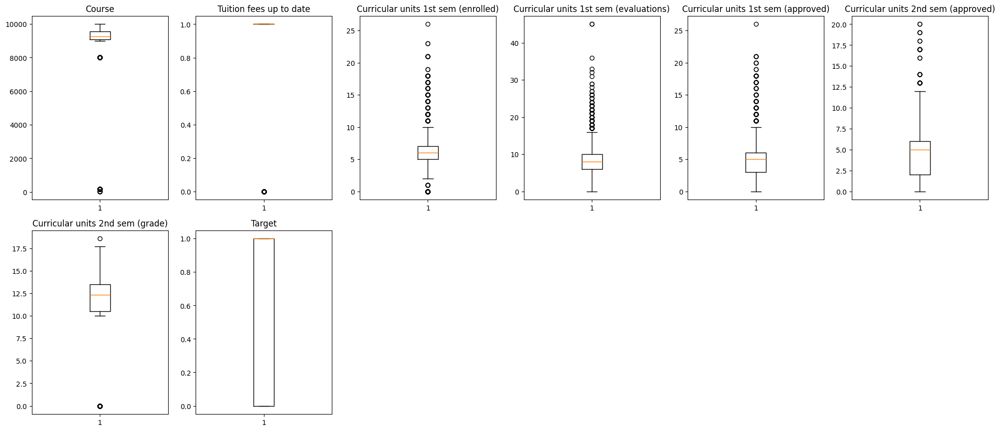

In [88]:
# Outlier detection using boxplots (for all I/R variables).

plt.figure(figsize=(20,30))

for i, variable in enumerate(df):
                     plt.subplot(7,6,i+1)
                     plt.boxplot(df[variable],whis=1.5)
                            
                     plt.tight_layout()
                     plt.title(variable)
                    

plt.show()

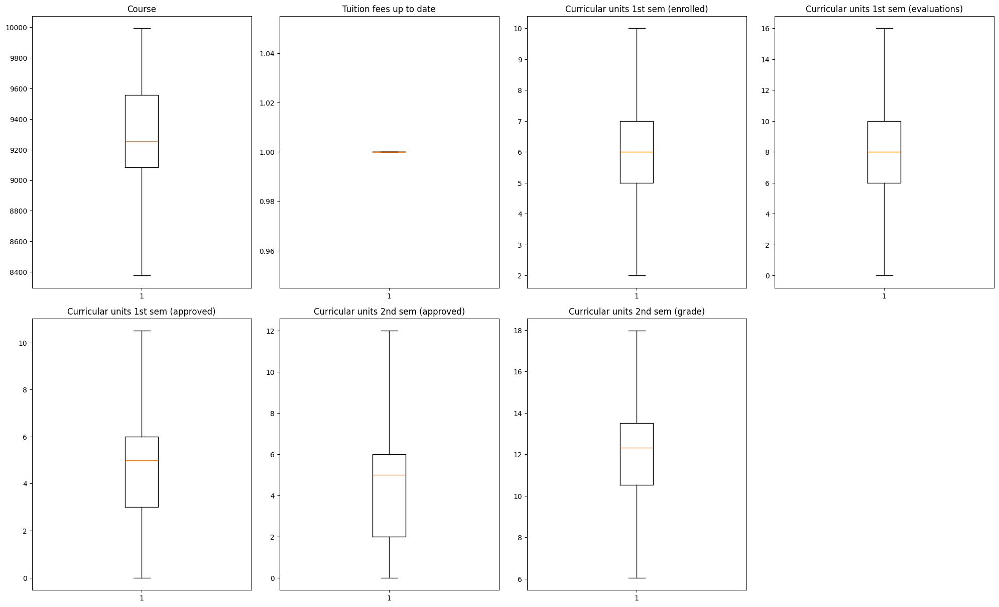

In [89]:
# Use flooring and capping method to remove outliers.
def treat_outliers(df,col):
    '''
    col: str, name of the numerical variable
    df: data frame
    col: name of the column
    '''
    Q1=df[col].quantile(0.25) 
    Q3=df[col].quantile(0.75) 
    IQR=Q3-Q1
    Lower_Whisker = Q1 - 1.5*IQR 
    Upper_Whisker = Q3 + 1.5*IQR
    df[col] = np.clip(df[col], Lower_Whisker, Upper_Whisker)                                                            
    return df

def treat_outliers_all(df, col_list):
    '''
    treat outlier in all numerical variables
    col_list: list of numerical variables
    df: data frame
    '''
    for c in col_list:
        df = treat_outliers(df,c)
    return df

numerical_col = df.select_dtypes(include=np.number).columns.tolist()
df = treat_outliers_all(df,numerical_col)

plt.figure(figsize=(20,30))

for i, variable in enumerate(numerical_col):
                     plt.subplot(5,4,i+1)
                     plt.boxplot(df[variable],whis=1.5)
                     plt.tight_layout()
                     plt.title(variable)

plt.show()

<div class="alert alert-block alert-info">
<b>Bivariate Data Analysis</b>
</div>

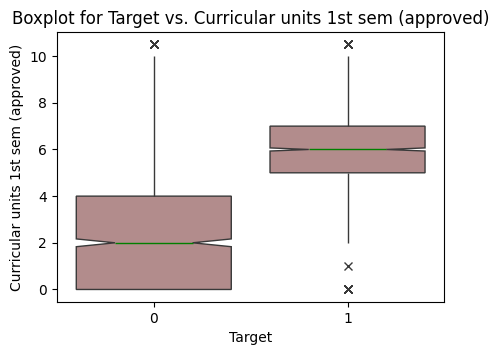

In [90]:
plt.figure(figsize=(5,3.5))
sns.boxplot(
    x = "Target", y = "Curricular units 1st sem (approved)", data = df,palette='viridis',
    notch=True, showcaps=False,
    flierprops={"marker": "x"},
    boxprops={"facecolor": (.4, .1, .1, .5)},
    medianprops={"color": "green"},
)
plt.title('Boxplot for Target vs. Curricular units 1st sem (approved)')
plt.show()

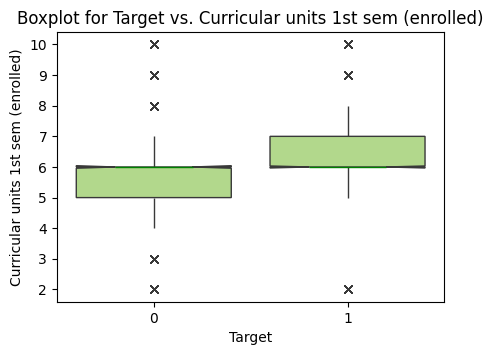

In [91]:
plt.figure(figsize=(5,3.5))
sns.boxplot(
    x = "Target", y = "Curricular units 1st sem (enrolled)", data = df,palette='viridis',
    notch=True, showcaps=False,
    flierprops={"marker": "x"},
    boxprops={"facecolor": (.4, .7, .1, .5)},
    medianprops={"color": "green"},
)
plt.title('Boxplot for Target vs. Curricular units 1st sem (enrolled)')
plt.show()

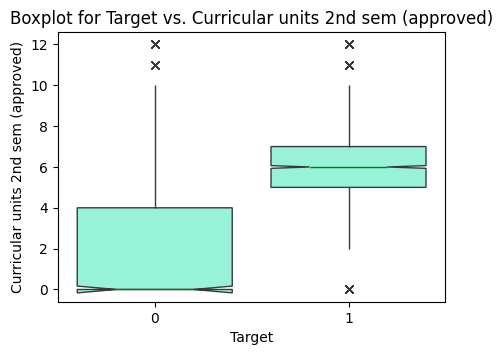

In [92]:
plt.figure(figsize=(5,3.5))
sns.boxplot(
    x = "Target", y = "Curricular units 2nd sem (approved)", data = df,palette='viridis',
    notch=True, showcaps=False,
    flierprops={"marker": "x"},
    boxprops={"facecolor": (.2, .9, .7, .5)},
    medianprops={"color": "green"},
)
plt.title('Boxplot for Target vs. Curricular units 2nd sem (approved)')
plt.show()

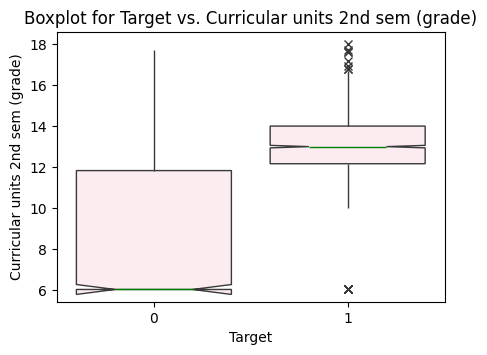

In [93]:
plt.figure(figsize=(5,3.5))
sns.boxplot(
    x = "Target", y = "Curricular units 2nd sem (grade)", data = df,palette='viridis',
    notch=True, showcaps=False,
    flierprops={"marker": "x"},
    boxprops={"facecolor": (.9, .3, .4, .1)},
    medianprops={"color": "green"},
)
plt.title('Boxplot for Target vs. Curricular units 2nd sem (grade)')
plt.show()

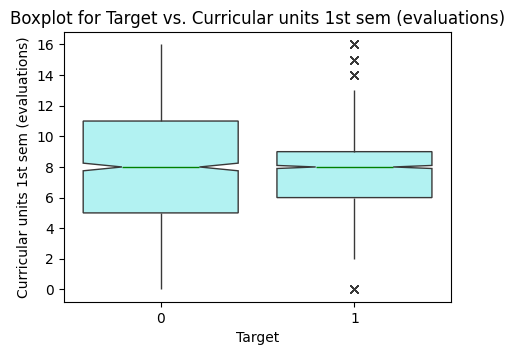

In [94]:
plt.figure(figsize=(5,3.5))
sns.boxplot(
    x = "Target", y = "Curricular units 1st sem (evaluations)", data = df,palette='viridis',
    notch=True, showcaps=False,
    flierprops={"marker": "x"},
    boxprops={"facecolor": (.4, .9, .9, .5)},
    medianprops={"color": "green"},
)
plt.title('Boxplot for Target vs. Curricular units 1st sem (evaluations)')
plt.show()


### *Note - The analysis has not been done for categorical variables.*

<div class="alert alert-block alert-info">
<b>Supervised Machine Learning (Classification)</b>
</div>

In [95]:
data=df.copy()
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3630 entries, 0 to 3629
Data columns (total 8 columns):
 #   Column                                  Non-Null Count  Dtype   
---  ------                                  --------------  -----   
 0   Course                                  3630 non-null   float64 
 1   Tuition fees up to date                 3630 non-null   int64   
 2   Curricular units 1st sem (enrolled)     3630 non-null   float64 
 3   Curricular units 1st sem (evaluations)  3630 non-null   float64 
 4   Curricular units 1st sem (approved)     3630 non-null   float64 
 5   Curricular units 2nd sem (approved)     3630 non-null   float64 
 6   Curricular units 2nd sem (grade)        3630 non-null   float64 
 7   Target                                  3630 non-null   category
dtypes: category(1), float64(6), int64(1)
memory usage: 202.3 KB


In [96]:
X = data.drop('Target',axis=1)  
y = data['Target'].astype('int64') 

In [97]:
# Splitting Data into Test Sets
X_train, X_test, y_train, y_test =train_test_split( X, y, test_size=0.3, random_state=1)
print(X_train.shape, X_test.shape)

(2541, 7) (1089, 7)


<div class="alert alert-block alert-warning">
<b>Creating a Function to Calculate Different Metric Scores of the Model - Accuracy, Recall, Precision and F1 Score</b>
</div>

In [98]:
def get_metrics_score(model,flag=True):
    # defining an empty list to store train and test results
    score_list=[] 
    
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)
    
    train_acc = model.score(X_train,y_train)
    test_acc = model.score(X_test,y_test)
    
    train_recall = metrics.recall_score(y_train,pred_train)
    test_recall = metrics.recall_score(y_test,pred_test)
    # Recall = minimizes false negatives
    
    train_precision = metrics.precision_score(y_train,pred_train)
    test_precision = metrics.precision_score(y_test,pred_test)
    # Precision = minimizes false positives
    
    train_f1 = f1_score(y_train,pred_train)
    test_f1 = f1_score(y_test,pred_test)
    
    score_list.extend((train_acc,test_acc,train_recall,test_recall,train_precision,test_precision,train_f1, test_f1))
        
    if flag == True: 
        print("Accuracy on training set : ",model.score(X_train,y_train))
        print("Accuracy on test set : ",model.score(X_test,y_test))
        print("Recall on training set : ",metrics.recall_score(y_train,pred_train))
        print("Recall on test set : ",metrics.recall_score(y_test,pred_test))
        print("Precision on training set : ",metrics.precision_score(y_train,pred_train))
        print("Precision on test set : ",metrics.precision_score(y_test,pred_test))
        print("F1-Score on training set : ",metrics.f1_score(y_train,pred_train))
        print("F1-Score on test set : ",metrics.f1_score(y_test,pred_test))
    
    return score_list # returns the list with train and test scores

<div class="alert alert-block alert-warning">
<b>Creating a Function to Make the Confusion Matrix</b>
</div>

In [99]:
def make_confusion_matrix(model,y_actual,labels=[1, 0]):
    y_predict = model.predict(X_test)
    cm=metrics.confusion_matrix( y_actual, y_predict, labels=[0, 1])
    df_cm = pd.DataFrame(cm, index = [i for i in ["Actual - No","Actual - Yes"]],
                  columns = [i for i in ['Predicted - No','Predicted - Yes']])
    group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in
                         cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in
              zip(group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    plt.figure(figsize = (10,7))
    sns.heatmap(df_cm, annot=labels,fmt='')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

<div class="alert alert-block alert-warning">
<b>Decision Tree Classifier Model</b>
</div>

In [100]:
dtree_classifier = DecisionTreeClassifier(criterion='gini',class_weight={0:0.5,1:0.55},random_state=1)
dtree_classifier.fit(X_train, y_train)
get_metrics_score(dtree_classifier)

Accuracy on training set :  0.9728453364817001
Accuracy on test set :  0.8503213957759412
Recall on training set :  1.0
Recall on test set :  0.8818040435458787
Precision on training set :  0.9577981651376147
Precision on test set :  0.8669724770642202
F1-Score on training set :  0.9784442361761949
F1-Score on test set :  0.874325366229761


[0.9728453364817001,
 0.8503213957759412,
 np.float64(1.0),
 np.float64(0.8818040435458787),
 np.float64(0.9577981651376147),
 np.float64(0.8669724770642202),
 np.float64(0.9784442361761949),
 np.float64(0.874325366229761)]

<div class="alert alert-block alert-warning">
<b>Decision Tree Classifier Model using Grid Search</b>
</div>

In [101]:
# Choose the type of classifier
dtree_gridsearch = DecisionTreeClassifier(random_state=1,class_weight = {0:0.5,1:0.55})

#{0:0.55,1:0.65}
#{0:0.6,1:0.671
#{0:0.5,1:0.63}
#{0:0.5,1:0.55}

#{0:0.5,1:0.5}

# Grid of parameters to choose from
parameters = {
            'max_depth': np.arange(15,27),
            'criterion': ['entropy','gini'],
            'splitter': ['best','random'],
            'min_impurity_decrease': [0.0001,0.001,0.001],
            'max_features': ['log2','sqrt']
             }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(dtree_gridsearch, parameters, scoring=scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
grid_search = grid_obj.best_estimator_

# Fit the best algorithm to the data
dtree_gridsearch.fit(X_train, y_train)

get_metrics_score(dtree_gridsearch)

Accuracy on training set :  0.9728453364817001
Accuracy on test set :  0.8503213957759412
Recall on training set :  1.0
Recall on test set :  0.8818040435458787
Precision on training set :  0.9577981651376147
Precision on test set :  0.8669724770642202
F1-Score on training set :  0.9784442361761949
F1-Score on test set :  0.874325366229761


[0.9728453364817001,
 0.8503213957759412,
 np.float64(1.0),
 np.float64(0.8818040435458787),
 np.float64(0.9577981651376147),
 np.float64(0.8669724770642202),
 np.float64(0.9784442361761949),
 np.float64(0.874325366229761)]

<div class="alert alert-block alert-warning">
<b>Random Forest Classifier</b>
</div>

In [102]:
# Fit the model
rf_estimator = RandomForestClassifier(random_state=1)
rf_estimator.fit(X_train,y_train)

# Calculate metrics
get_metrics_score(rf_estimator)

Accuracy on training set :  0.9728453364817001
Accuracy on test set :  0.8778696051423324
Recall on training set :  0.9987228607918263
Recall on test set :  0.9346811819595645
Precision on training set :  0.9589209074187615
Precision on test set :  0.8684971098265896
F1-Score on training set :  0.9784172661870504
F1-Score on test set :  0.900374531835206


[0.9728453364817001,
 0.8778696051423324,
 np.float64(0.9987228607918263),
 np.float64(0.9346811819595645),
 np.float64(0.9589209074187615),
 np.float64(0.8684971098265896),
 np.float64(0.9784172661870504),
 np.float64(0.900374531835206)]

<div class="alert alert-block alert-warning">
<b>Bagging Classifier</b>
</div>

In [103]:
# Fit the model
bagging_classifier = BaggingClassifier(random_state=1)
bagging_classifier.fit(X_train,y_train)

# Calculate metrics
get_metrics_score(bagging_classifier)

Accuracy on training set :  0.9677292404565132
Accuracy on test set :  0.8604224058769513
Recall on training set :  0.9910600255427842
Recall on test set :  0.9020217729393468
Precision on training set :  0.9580246913580247
Precision on test set :  0.866965620328849
F1-Score on training set :  0.9742623979912115
F1-Score on test set :  0.8841463414634146


[0.9677292404565132,
 0.8604224058769513,
 np.float64(0.9910600255427842),
 np.float64(0.9020217729393468),
 np.float64(0.9580246913580247),
 np.float64(0.866965620328849),
 np.float64(0.9742623979912115),
 np.float64(0.8841463414634146)]

<div class="alert alert-block alert-warning">
<b>Tuned Decision Tree</b>
</div>

In [104]:
dtree_tuned = DecisionTreeClassifier(class_weight={0:0.5,1:0.55},random_state=1)

parameters = {'max_depth': np.arange(2,10), 
              'min_samples_leaf': [5, 7, 10, 15],
              'max_leaf_nodes' : [2, 3, 5, 10,15],
              'min_impurity_decrease': [0.0001,0.001,0.01,0.1]
             }

scorer = metrics.make_scorer(metrics.recall_score)

grid_obj = GridSearchCV(dtree_classifier, parameters, scoring=scorer,n_jobs=-1)
grid_obj = grid_obj.fit(X_train, y_train)

dtree_tuned = grid_obj.best_estimator_

dtree_tuned.fit(X_train, y_train)
get_metrics_score(dtree_tuned)

Accuracy on training set :  0.8626524990161354
Accuracy on test set :  0.8686868686868687
Recall on training set :  0.9814814814814815
Recall on test set :  0.9844479004665629
Precision on training set :  0.8276790522347873
Precision on test set :  0.8263707571801566
F1-Score on training set :  0.8980426526438796
F1-Score on test set :  0.8985095812633073


[0.8626524990161354,
 0.8686868686868687,
 np.float64(0.9814814814814815),
 np.float64(0.9844479004665629),
 np.float64(0.8276790522347873),
 np.float64(0.8263707571801566),
 np.float64(0.8980426526438796),
 np.float64(0.8985095812633073)]

<div class="alert alert-block alert-warning">
<b>Tuned Bagging Classifier</b>
</div>

In [105]:
bagging_tuned = BaggingClassifier(random_state=1)

parameters = {'max_samples': [0.7,0.8,0.9,1], 
              'max_features': [0.7,0.8,0.9,1],
              'n_estimators' : [10,20,30,40,50],
             }

acc_scorer = metrics.make_scorer(metrics.recall_score)

grid_obj = GridSearchCV(bagging_tuned, parameters, scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

bagging_tuned = grid_obj.best_estimator_

bagging_tuned.fit(X_train, y_train)
get_metrics_score(bagging_tuned)

Accuracy on training set :  0.8488783943329398
Accuracy on test set :  0.8530762167125804
Recall on training set :  0.9489144316730523
Recall on test set :  0.9564541213063764
Precision on training set :  0.8301675977653631
Precision on test set :  0.8232931726907631
F1-Score on training set :  0.8855780691299165
F1-Score on test set :  0.8848920863309353


[0.8488783943329398,
 0.8530762167125804,
 np.float64(0.9489144316730523),
 np.float64(0.9564541213063764),
 np.float64(0.8301675977653631),
 np.float64(0.8232931726907631),
 np.float64(0.8855780691299165),
 np.float64(0.8848920863309353)]

<div class="alert alert-block alert-warning">
<b>Tuned Random Forest</b>
</div>

<div class="alert alert-block alert-warning">
<b>AdaBoost</b>
</div>

In [106]:
adaboost=AdaBoostClassifier(random_state=1)
adaboost.fit(X_train,y_train)
get_metrics_score(adaboost)


Accuracy on training set :  0.8850846123573396
Accuracy on test set :  0.8870523415977961
Recall on training set :  0.9265644955300127
Recall on test set :  0.926905132192846
Precision on training set :  0.8912776412776413
Precision on test set :  0.8869047619047619
F1-Score on training set :  0.9085785848465874
F1-Score on test set :  0.9064638783269962


[0.8850846123573396,
 0.8870523415977961,
 np.float64(0.9265644955300127),
 np.float64(0.926905132192846),
 np.float64(0.8912776412776413),
 np.float64(0.8869047619047619),
 np.float64(0.9085785848465874),
 np.float64(0.9064638783269962)]

<div class="alert alert-block alert-warning">
<b>Tuned AdaBoost</b>
</div>

In [107]:
%%time
adaboost_tuned = AdaBoostClassifier(random_state=1)

parameters = {'n_estimators': np.arange(10,100,10),                
              'learning_rate': [1, 0.1, 0.5, 0.01],                
              }

scorer = metrics.make_scorer(metrics.r2_score)

grid_obj = GridSearchCV(adaboost_tuned, parameters, scoring=scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

adaboost_tuned = grid_obj.best_estimator_
 
adaboost_tuned.fit(X_train, y_train)
get_metrics_score(adaboost_tuned)

Accuracy on training set :  0.885478158205431
Accuracy on test set :  0.8925619834710744
Recall on training set :  0.9265644955300127
Recall on test set :  0.926905132192846
Precision on training set :  0.8918254456054088
Precision on test set :  0.8948948948948949
F1-Score on training set :  0.9088631381146257
F1-Score on test set :  0.9106187929717342
CPU times: user 8.65 s, sys: 113 ms, total: 8.77 s
Wall time: 8.82 s


[0.885478158205431,
 0.8925619834710744,
 np.float64(0.9265644955300127),
 np.float64(0.926905132192846),
 np.float64(0.8918254456054088),
 np.float64(0.8948948948948949),
 np.float64(0.9088631381146257),
 np.float64(0.9106187929717342)]

<div class="alert alert-block alert-warning">
<b>Gradient Boost</b>
</div>

In [108]:
gradient_boost=GradientBoostingClassifier(random_state=1)
gradient_boost.fit(X_train,y_train)

get_metrics_score(gradient_boost)


Accuracy on training set :  0.9110586383313656
Accuracy on test set :  0.8907254361799817
Recall on training set :  0.9808429118773946
Recall on test set :  0.9533437013996889
Precision on training set :  0.8868360277136259
Precision on test set :  0.8732193732193733
F1-Score on training set :  0.9314736203759855
F1-Score on test set :  0.9115241635687732


[0.9110586383313656,
 0.8907254361799817,
 np.float64(0.9808429118773946),
 np.float64(0.9533437013996889),
 np.float64(0.8868360277136259),
 np.float64(0.8732193732193733),
 np.float64(0.9314736203759855),
 np.float64(0.9115241635687732)]

<div class="alert alert-block alert-warning">
<b>Tuned Gradient Boost</b>
</div>

In [109]:
%%time

# Create the initial model
base_estimator = DecisionTreeClassifier(max_depth=1)

gb_tuned = GradientBoostingClassifier(init=base_estimator,random_state=1)

parameters = {
    "n_estimators": [20,50,100,150],
    "subsample":[0.8,0.9,1],
    "max_features":[0.7,0.8,0.9,1]
}

acc_scorer = metrics.make_scorer(metrics.recall_score)

grid_obj = GridSearchCV(gb_tuned, parameters, scoring=acc_scorer,cv=5)

grid_obj = grid_obj.fit(X_train, y_train)

gb_tuned = grid_obj.best_estimator_

gb_tuned.fit(X_train, y_train)

get_metrics_score(gb_tuned)

Accuracy on training set :  0.8968909878000787
Accuracy on test set :  0.8870523415977961
Recall on training set :  0.9712643678160919
Recall on test set :  0.9626749611197511
Precision on training set :  0.8751438434982739
Precision on test set :  0.862116991643454
F1-Score on training set :  0.9207021791767555
F1-Score on test set :  0.9096252755326966
CPU times: user 15.9 s, sys: 129 ms, total: 16 s
Wall time: 16.4 s


[0.8968909878000787,
 0.8870523415977961,
 np.float64(0.9712643678160919),
 np.float64(0.9626749611197511),
 np.float64(0.8751438434982739),
 np.float64(0.862116991643454),
 np.float64(0.9207021791767555),
 np.float64(0.9096252755326966)]

<div class="alert alert-block alert-warning">
<b>XG Boost</b>
</div>

In [110]:
xgb = XGBClassifier(random_state=1, eval_metric='logloss')
xgb.fit(X_train,y_train)
xgb_score=get_metrics_score(xgb)

Accuracy on training set :  0.9567099567099567
Accuracy on test set :  0.8852157943067034
Recall on training set :  0.9961685823754789
Recall on test set :  0.9409020217729394
Precision on training set :  0.9375
Precision on test set :  0.8742774566473989
F1-Score on training set :  0.9659442724458205
F1-Score on test set :  0.9063670411985019


<div class="alert alert-block alert-warning">
<b>XG Boost Tuned</b>
</div>

In [111]:
%%time
xgb_tuned = XGBClassifier(random_state=1, eval_metric='logloss')

parameters = {
    "n_estimators": [10,30,50],
    "scale_pos_weight":[1,2,5],
    "subsample":[0.7,0.9,1],
    "learning_rate":[0.05,0.1,0.2],
    "colsample_bytree":[0.7,0.9,1],
    "colsample_bylevel":[0.5,0.7,1]
}

scorer = metrics.make_scorer(metrics.f1_score)

grid_obj = GridSearchCV(xgb_tuned, parameters,scoring=scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

xgb_tuned = grid_obj.best_estimator_

xgb_tuned.fit(X_train, y_train)
get_metrics_score(xgb_tuned)

KeyboardInterrupt: 

<div class="alert alert-block alert-warning">
<b>KNN</b>
</div>

In [56]:
from sklearn.metrics import matthews_corrcoef
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(3) # Define classifier
knn.fit(X_train, y_train) # Train model

# Make predictions
y_train_pred = knn.predict(X_train)
y_test_pred = knn.predict(X_test)

# Training set performance
knn_train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
knn_train_mcc = matthews_corrcoef(y_train, y_train_pred) # Calculate MCC
knn_train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
knn_test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
knn_test_mcc = matthews_corrcoef(y_test, y_test_pred) # Calculate MCC
knn_test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

print('Model performance for Training set')
print('- Accuracy: %s' % knn_train_accuracy)
print('- MCC: %s' % knn_train_mcc)
print('- F1 score: %s' % knn_train_f1)
print('----------------------------------')
print('Model performance for Test set')
print('- Accuracy: %s' % knn_test_accuracy)
print('- MCC: %s' % knn_test_mcc)
print('- F1 score: %s' % knn_test_f1)

Model performance for Training set
- Accuracy: 0.9161747343565525
- MCC: 0.8243601399701154
- F1 score: 0.9145845270489047
----------------------------------
Model performance for Test set
- Accuracy: 0.8741965105601469
- MCC: 0.740481653619297
- F1 score: 0.8720478746720137


<div class="alert alert-block alert-warning">
<b>SVC</b>
</div>

In [57]:

from sklearn.svm import SVC

svm_rbf = SVC(gamma=2, C=1)
svm_rbf.fit(X_train, y_train)

# Make predictions
y_train_pred = svm_rbf.predict(X_train)
y_test_pred = svm_rbf.predict(X_test)

# Training set performance
svm_rbf_train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
svm_rbf_train_mcc = matthews_corrcoef(y_train, y_train_pred) # Calculate MCC
svm_rbf_train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
svm_rbf_test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
svm_rbf_test_mcc = matthews_corrcoef(y_test, y_test_pred) # Calculate MCC
svm_rbf_test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

print('Model performance for Training set')
print('- Accuracy: %s' % svm_rbf_train_accuracy)
print('- MCC: %s' % svm_rbf_train_mcc)
print('- F1 score: %s' % svm_rbf_train_f1)
print('----------------------------------')
print('Model performance for Test set')
print('- Accuracy: %s' % svm_rbf_test_accuracy)
print('- MCC: %s' % svm_rbf_test_mcc)
print('- F1 score: %s' % svm_rbf_test_f1)
print("----------------------------------")
get_metrics_score(svm_rbf)

Model performance for Training set
- Accuracy: 0.9578905942542306
- MCC: 0.9123532336349546
- F1 score: 0.95742092100971
----------------------------------
Model performance for Test set
- Accuracy: 0.8062442607897153
- MCC: 0.6063629411920989
- F1 score: 0.7964874289848979
----------------------------------
Accuracy on training set :  0.9578905942542306
Accuracy on test set :  0.8062442607897153
Recall on training set :  0.9968071519795658
Recall on test set :  0.9548989113530326
Precision on training set :  0.9386650631389056
Precision on test set :  0.7713567839195979
F1-Score on training set :  0.9668628058222359
F1-Score on test set :  0.8533703961084086


[0.9578905942542306,
 0.8062442607897153,
 np.float64(0.9968071519795658),
 np.float64(0.9548989113530326),
 np.float64(0.9386650631389056),
 np.float64(0.7713567839195979),
 np.float64(0.9668628058222359),
 np.float64(0.8533703961084086)]

<div class="alert alert-block alert-warning">
<b>Neural Networks</b>
</div>

In [58]:

from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(alpha=1, max_iter=1000)
mlp.fit(X_train, y_train)

# Make predictions
y_train_pred = mlp.predict(X_train)
y_test_pred = mlp.predict(X_test)

# Training set performance
mlp_train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
mlp_train_mcc = matthews_corrcoef(y_train, y_train_pred) # Calculate MCC
mlp_train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
mlp_test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
mlp_test_mcc = matthews_corrcoef(y_test, y_test_pred) # Calculate MCC
mlp_test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

print('Model performance for Training set')
print('- Accuracy: %s' % mlp_train_accuracy)
print('- MCC: %s' % mlp_train_mcc)
print('- F1 score: %s' % mlp_train_f1)
print('----------------------------------')
print('Model performance for Test set')
print('- Accuracy: %s' % mlp_test_accuracy)
print('- MCC: %s' % mlp_test_mcc)
print('- F1 score: %s' % mlp_test_f1)
print("----------------------------------")
get_metrics_score(mlp)

Model performance for Training set
- Accuracy: 0.7973238882329792
- MCC: 0.574304347035681
- F1 score: 0.7825918257020132
----------------------------------
Model performance for Test set
- Accuracy: 0.8163452708907254
- MCC: 0.6323727559598308
- F1 score: 0.8062406469072081
----------------------------------
Accuracy on training set :  0.7973238882329792
Accuracy on test set :  0.8163452708907254
Recall on training set :  0.9636015325670498
Recall on test set :  0.9704510108864697
Precision on training set :  0.7671581087951195
Precision on test set :  0.7751552795031056
F1-Score on training set :  0.8542315312765355
F1-Score on test set :  0.861878453038674


[0.7973238882329792,
 0.8163452708907254,
 np.float64(0.9636015325670498),
 np.float64(0.9704510108864697),
 np.float64(0.7671581087951195),
 np.float64(0.7751552795031056),
 np.float64(0.8542315312765355),
 np.float64(0.861878453038674)]

<div class="alert alert-block alert-warning">
<b>Stacking Classifier Model 1</b>
</div>

In [59]:
%%time
# Define estimators
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression

estimator_list = [('Adaboost',adaboost),('Tuned Adaboost',adaboost_tuned),('Gradient Boost',gradient_boost),('decision tree',dtree_classifier),('GC',dtree_gridsearch)]
#,('stack2',stack_model_2),('stack3',stack_model_3)]
# Build stack model
stack_model_1 = StackingClassifier(
    estimators=estimator_list, final_estimator=LogisticRegression()
)

# Train stacked model
stack_model_1.fit(X_train, y_train)

# Make predictions
y_train_pred = stack_model_1.predict(X_train)
y_test_pred = stack_model_1.predict(X_test)

# Training set model performance
stack_model_train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
stack_model_train_mcc = matthews_corrcoef(y_train, y_train_pred) # Calculate MCC
stack_model_train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set model performance
stack_model_test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
stack_model_test_mcc = matthews_corrcoef(y_test, y_test_pred) # Calculate MCC
stack_model_test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

print('Model performance for Training set')
print('- Accuracy: %s' % stack_model_train_accuracy)
print('- MCC: %s' % stack_model_train_mcc)
print('- F1 score: %s' % stack_model_train_f1)
print('----------------------------------')
print('Model performance for Test set')
print('- Accuracy: %s' % stack_model_test_accuracy)
print('- MCC: %s' % stack_model_test_mcc)
print('- F1 score: %s' % stack_model_test_f1)
print("----------------------------------")
get_metrics_score(stack_model_1)

Model performance for Training set
- Accuracy: 0.91538764266037
- MCC: 0.8200940758497303
- F1 score: 0.9149682478855782
----------------------------------
Model performance for Test set
- Accuracy: 0.8943985307621671
- MCC: 0.7810893579647734
- F1 score: 0.8942273128415412
----------------------------------
Accuracy on training set :  0.91538764266037
Accuracy on test set :  0.8943985307621671
Recall on training set :  0.946360153256705
Recall on test set :  0.9175738724727839
Precision on training set :  0.9187848729076256
Precision on test set :  0.9049079754601227
F1-Score on training set :  0.9323686693928909
F1-Score on test set :  0.9111969111969112
CPU times: user 1.6 s, sys: 16.8 ms, total: 1.61 s
Wall time: 1.66 s


[0.91538764266037,
 0.8943985307621671,
 np.float64(0.946360153256705),
 np.float64(0.9175738724727839),
 np.float64(0.9187848729076256),
 np.float64(0.9049079754601227),
 np.float64(0.9323686693928909),
 np.float64(0.9111969111969112)]

<div class="alert alert-block alert-warning">
<b>Stacking Classifier Model 2</b>
</div>

In [60]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression

estimator_list = [('Adaboost',adaboost),('Tuned Adaboost',adaboost_tuned),('Gradient Boost',gradient_boost),('decision tree',dtree_classifier)]

# Build stack model
stack_model_2 = StackingClassifier(
    estimators=estimator_list, final_estimator=LogisticRegression()
)

# Train stacked model
stack_model_2.fit(X_train, y_train)

# Make predictions
y_train_pred = stack_model_2.predict(X_train)
y_test_pred = stack_model_2.predict(X_test)

# Training set model performance
stack_model_train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
stack_model_train_mcc = matthews_corrcoef(y_train, y_train_pred) # Calculate MCC
stack_model_train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set model performance
stack_model_test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
stack_model_test_mcc = matthews_corrcoef(y_test, y_test_pred) # Calculate MCC
stack_model_test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

print('Model performance for Training set')
print('- Accuracy: %s' % stack_model_train_accuracy)
print('- MCC: %s' % stack_model_train_mcc)
print('- F1 score: %s' % stack_model_train_f1)
print('----------------------------------')
print('Model performance for Test set')
print('- Accuracy: %s' % stack_model_test_accuracy)
print('- MCC: %s' % stack_model_test_mcc)
print('- F1 score: %s' % stack_model_test_f1)
print("----------------------------------")
get_metrics_score(stack_model_2)

Model performance for Training set
- Accuracy: 0.91538764266037
- MCC: 0.8200940758497303
- F1 score: 0.9149682478855782
----------------------------------
Model performance for Test set
- Accuracy: 0.8943985307621671
- MCC: 0.7810893579647734
- F1 score: 0.8942273128415412
----------------------------------
Accuracy on training set :  0.91538764266037
Accuracy on test set :  0.8943985307621671
Recall on training set :  0.946360153256705
Recall on test set :  0.9175738724727839
Precision on training set :  0.9187848729076256
Precision on test set :  0.9049079754601227
F1-Score on training set :  0.9323686693928909
F1-Score on test set :  0.9111969111969112


[0.91538764266037,
 0.8943985307621671,
 np.float64(0.946360153256705),
 np.float64(0.9175738724727839),
 np.float64(0.9187848729076256),
 np.float64(0.9049079754601227),
 np.float64(0.9323686693928909),
 np.float64(0.9111969111969112)]

<div class="alert alert-block alert-warning">
<b>Stacking Classifier Model 3</b>
</div>

In [61]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression

estimator_list = [('Adaboost',adaboost),('Tuned Adaboost',adaboost_tuned),('Gradient Boost',gradient_boost)]
# Build stack model
stack_model_3 = StackingClassifier(
    estimators=estimator_list, final_estimator=LogisticRegression()
)

# Train stacked model
stack_model_3.fit(X_train, y_train)

# Make predictions
y_train_pred = stack_model_3.predict(X_train)
y_test_pred = stack_model_3.predict(X_test)

# Training set model performance
stack_model_train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
stack_model_train_mcc = matthews_corrcoef(y_train, y_train_pred) # Calculate MCC
stack_model_train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set model performance
stack_model_test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
stack_model_test_mcc = matthews_corrcoef(y_test, y_test_pred) # Calculate MCC
stack_model_test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

print('Model performance for Training set')
print('- Accuracy: %s' % stack_model_train_accuracy)
print('- MCC: %s' % stack_model_train_mcc)
print('- F1 score: %s' % stack_model_train_f1)
print('----------------------------------')
print('Model performance for Test set')
print('- Accuracy: %s' % stack_model_test_accuracy)
print('- MCC: %s' % stack_model_test_mcc)
print('- F1 score: %s' % stack_model_test_f1)
print("----------------------------------")
get_metrics_score(stack_model_3)

Model performance for Training set
- Accuracy: 0.9090909090909091
- MCC: 0.8066958761632197
- F1 score: 0.9086815818900267
----------------------------------
Model performance for Test set
- Accuracy: 0.8943985307621671
- MCC: 0.7809123935475066
- F1 score: 0.8941460463438394
----------------------------------
Accuracy on training set :  0.9090909090909091
Accuracy on test set :  0.8943985307621671
Recall on training set :  0.9399744572158365
Recall on test set :  0.9206842923794712
Precision on training set :  0.9148539465506526
Precision on test set :  0.9024390243902439
F1-Score on training set :  0.927244094488189
F1-Score on test set :  0.9114703618167821


[0.9090909090909091,
 0.8943985307621671,
 np.float64(0.9399744572158365),
 np.float64(0.9206842923794712),
 np.float64(0.9148539465506526),
 np.float64(0.9024390243902439),
 np.float64(0.927244094488189),
 np.float64(0.9114703618167821)]

<div class="alert alert-block alert-warning">
<b>Logistic Regression Model</b>
</div>

In [62]:

features = ['Course', 'Tuition fees up to date', 'Curricular units 1st sem (evaluations)', 'Curricular units 1st sem (approved)', 'Curricular units 2nd sem (approved)', 'Curricular units 2nd sem (grade)','Curricular units 1st sem (enrolled)']
label = 'Target'
X, y = df[features].values, df[label].values
for n in range (0, 4) :
    print ("Student", str (n+1),"In Features:", list (X[n]),"In Label:", y[n])
    
    
# Train the model
from sklearn.linear_model import LogisticRegression
# Set regularization rate
reg = 0.01
# train a logistic regression model on the training set
logistic_model = LogisticRegression (C=1/reg, solver="liblinear").fit (X_train, y_train)
print (logistic_model)


predictions = logistic_model.predict(X_test)
get_metrics_score(logistic_model)

Student 1 In Features: [np.float64(8378.5), np.float64(1.0), np.float64(0.0), np.float64(0.0), np.float64(0.0), np.float64(6.044642856250001), np.float64(2.0)] In Label: 0
Student 2 In Features: [np.float64(9070.0), np.float64(1.0), np.float64(0.0), np.float64(0.0), np.float64(0.0), np.float64(6.044642856250001), np.float64(6.0)] In Label: 0
Student 3 In Features: [np.float64(9254.0), np.float64(1.0), np.float64(5.0), np.float64(0.0), np.float64(0.0), np.float64(6.044642856250001), np.float64(5.0)] In Label: 0
Student 4 In Features: [np.float64(9238.0), np.float64(1.0), np.float64(9.0), np.float64(5.0), np.float64(2.0), np.float64(13.5), np.float64(6.0)] In Label: 0
LogisticRegression(C=100.0, solver='liblinear')
Accuracy on training set :  0.8795749704840614
Accuracy on test set :  0.8842975206611571
Recall on training set :  0.9252873563218391
Recall on test set :  0.9206842923794712
Precision on training set :  0.8846153846153846
Precision on test set :  0.8875562218890555
F1-Score 

[0.8795749704840614,
 0.8842975206611571,
 np.float64(0.9252873563218391),
 np.float64(0.9206842923794712),
 np.float64(0.8846153846153846),
 np.float64(0.8875562218890555),
 np.float64(0.9044943820224719),
 np.float64(0.9038167938931297)]

<div class="alert alert-block alert-info">
<b>Comparing Metrics of all Models</b>
</div>

In [63]:
# defining list of models
models = [adaboost, adaboost_tuned, gradient_boost, gb_tuned, xgb, xgb_tuned,bagging_tuned
,dtree_tuned
,bagging_classifier
,rf_estimator
,dtree_gridsearch
,dtree_classifier,stack_model_1,stack_model_2,mlp,svm_rbf,knn,stack_model_3,logistic_model]

# defining empty lists to add train and test results
acc_train = []
acc_test = []
recall_train = []
recall_test = []
precision_train = []
precision_test = []
f1_train = []
f1_test = []

# looping through all the models to get the accuracy, precall and precision scores
for model in models:
    j = get_metrics_score(model,False)
    acc_train.append(np.round(j[0],2))
    acc_test.append(np.round(j[1],2))
    recall_train.append(np.round(j[2],2))
    recall_test.append(np.round(j[3],2))
    precision_train.append(np.round(j[4],2))
    precision_test.append(np.round(j[5],2))
    f1_train.append(np.round(j[6],2))
    f1_test.append(np.round(j[7],2))

In [64]:
# Sorting by recall
comparison_frame = pd.DataFrame({'Model':['AdaBoost','Tuned AdaBoost', 'Gradient Boost','Tuned Gradient Boost',
                                          'XGBoost','Tuned XGBoost','Tuned Bagging','Tuned Decision Tree','Bagging Classifier','Random Forest','GridSearch Tree','Decision Tree','Stacking Classifier 1','Stacking Classifier 2','Neural Network','SVM','KNN','Stacking Classifier 3','Logistic Regression'], 
                                          'Train_Accuracy': acc_train,
                                          'Test_Accuracy': acc_test,
                                          'Train_Recall': recall_train,
                                          'Test_Recall': recall_test,
                                          'Train_Precision': precision_train,
                                          'Test_Precision': precision_test,
                                          'Train_F1': f1_train,
                                          'Test_F1': f1_test}) 

comparison_frame.sort_values(by='Test_Recall',ascending=False)


,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
7,Tuned Decision Tree,0.86,0.87,0.98,0.98,0.83,0.83,0.90,0.90
14,Neural Network,0.80,0.82,0.96,0.97,0.77,0.78,0.85,0.86
5,Tuned XGBoost,0.92,0.89,1.00,0.97,0.88,0.86,0.94,0.91
3,Tuned Gradient Boost,0.90,0.89,0.97,0.96,0.88,0.86,0.92,0.91
6,Tuned Bagging,0.85,0.85,0.95,0.96,0.83,0.82,0.89,0.88
2,Gradient Boost,0.91,0.89,0.98,0.95,0.89,0.87,0.93,0.91
16,KNN,0.92,0.87,0.98,0.95,0.89,0.85,0.94,0.90
15,SVM,0.96,0.81,1.00,0.95,0.94,0.77,0.97,0.85
4,XGBoost,0.96,0.89,1.00,0.94,0.94,0.87,0.97,0.91
0,AdaBoost,0.89,0.89,0.93,0.93,0.89,0.89,0.91,0.91


In [65]:
# Sorting by precision
comparison_frame.sort_values(by='Test_Precision',ascending=False)


,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1
17,Stacking Classifier 3,0.91,0.89,0.94,0.92,0.91,0.90,0.93,0.91
13,Stacking Classifier 2,0.92,0.89,0.95,0.92,0.92,0.90,0.93,0.91
12,Stacking Classifier 1,0.92,0.89,0.95,0.92,0.92,0.90,0.93,0.91
0,AdaBoost,0.89,0.89,0.93,0.93,0.89,0.89,0.91,0.91
1,Tuned AdaBoost,0.89,0.89,0.93,0.93,0.89,0.89,0.91,0.91
18,Logistic Regression,0.88,0.88,0.93,0.92,0.88,0.89,0.90,0.90
8,Bagging Classifier,0.97,0.86,0.99,0.90,0.96,0.87,0.97,0.88
10,GridSearch Tree,0.97,0.85,1.00,0.88,0.96,0.87,0.98,0.87
11,Decision Tree,0.97,0.85,1.00,0.88,0.96,0.87,0.98,0.87
4,XGBoost,0.96,0.89,1.00,0.94,0.94,0.87,0.97,0.91


### The selected model is Stacking Classifier 3 as it offers the best results. 

<div class="alert alert-block alert-info">
<b>Confusion Matrix for Selected Model</b>
</div>

Text(0.5, 1.0, 'Stacking Classifier Confusion Matrix')

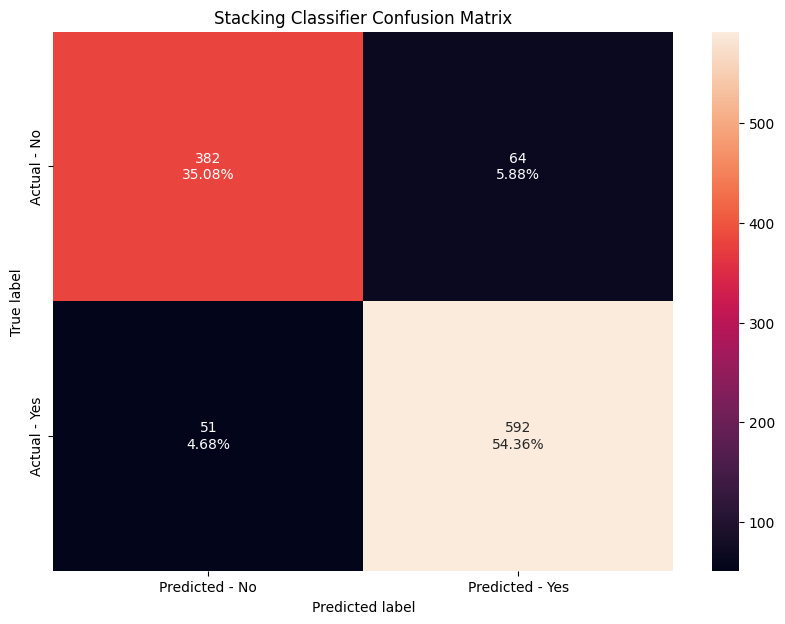

In [66]:
make_confusion_matrix(stack_model_3,y_test)
plt.title("Stacking Classifier Confusion Matrix")

<div class="alert alert-block alert-info">
<b>ROC Curve for selected Model</b>
</div>

In [67]:
y_scores = stack_model_3.predict_proba(X_test)
print(y_scores)

[[0.95961555 0.04038445]
 [0.27274282 0.72725718]
 [0.96001822 0.03998178]
 ...
 [0.15482934 0.84517066]
 [0.95899214 0.04100786]
 [0.95834078 0.04165922]]


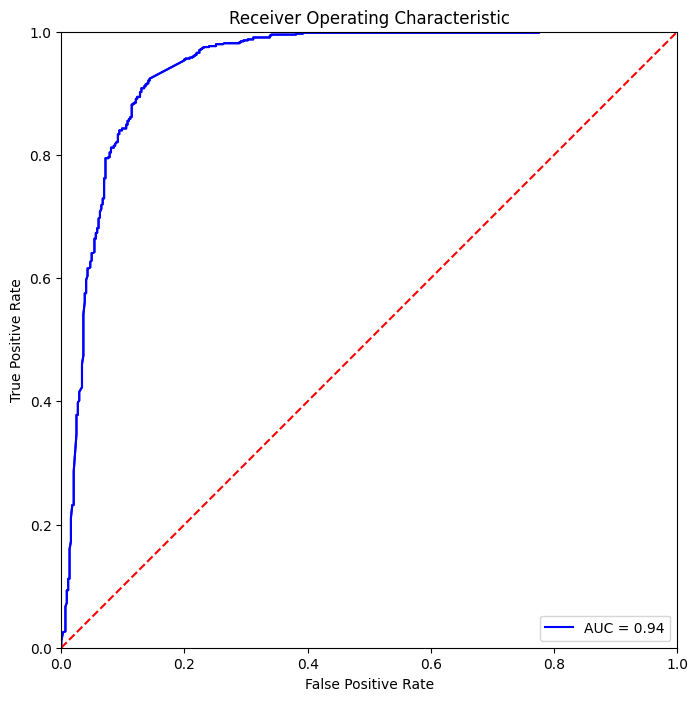

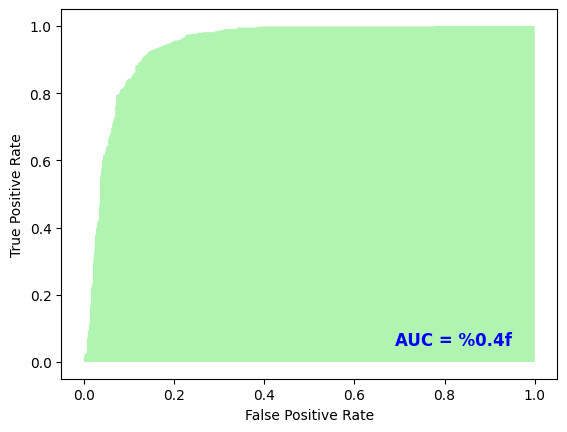

In [68]:

from sklearn import metrics
import sklearn.metrics as metrics
from pandas import*
# calculate the fpr and tpr for all thresholds of the classification
probs = stack_model_3.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize=(10, 8), dpi=100)
plt.axis('scaled')

plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()
plt.fill_between(fpr, tpr, facecolor='lightgreen', alpha=0.7)
plt.text(0.95, 0.05, 'AUC = %0.4f' , ha='right', fontsize=12, weight='bold', color='blue')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()

<div class="alert alert-block alert-info">
<b>Feature importance selected Model</b>
</div>

Text(0.5, 1.0, 'Attribute Importance')

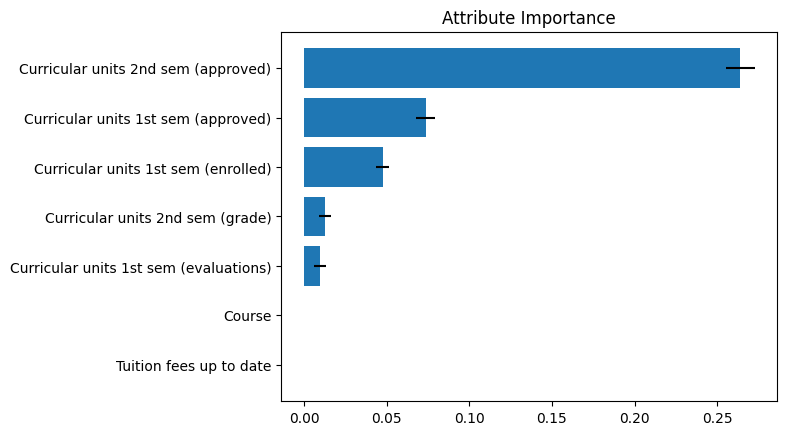

In [69]:
def get_score_after_permutation(model, X, y, curr_feat):
    """return the score of model when curr_feat is permuted"""

    X_permuted = X.copy()
    col_idx = list(X.columns).index(curr_feat)
    # permute one column
    X_permuted.iloc[:, col_idx] = np.random.permutation(
        X_permuted[curr_feat].values
    )

    permuted_score = model.score(X_permuted, y)
    return permuted_score

def permutation_importance(model, X, y, n_repeats=10):
    """Calculate importance score for each feature."""

    importances = []
    for curr_feat in X.columns:
        list_feature_importance = []
        for n_round in range(n_repeats):
            list_feature_importance.append(
                get_feature_importance(model, X, y, curr_feat)
            )

        importances.append(list_feature_importance)

    return {
        "importances_mean": np.mean(importances, axis=1),
        "importances_std": np.std(importances, axis=1),
        "importances": importances,
    }

def get_feature_importance(model, X, y, curr_feat):
    """compare the score when curr_feat is permuted"""

    baseline_score_train = model.score(X, y)
    permuted_score_train = get_score_after_permutation(model, X, y, curr_feat)

    # feature importance is the difference between the two scores
    feature_importance = baseline_score_train - permuted_score_train
    return feature_importance

# This function could directly be access from sklearn
# from sklearn.inspection import permutation_importance

def plot_feature_importances(perm_importance_result, feat_name):
    """bar plot the feature importance"""

    fig, ax = plt.subplots()

    indices = perm_importance_result["importances_mean"].argsort()
    plt.barh(
        range(len(indices)),
        perm_importance_result["importances_mean"][indices],
        xerr=perm_importance_result["importances_std"][indices],
    )

    ax.set_yticks(range(len(indices)))
    _ = ax.set_yticklabels(feat_name[indices])
    
perm_importance_result_train = permutation_importance(
    model, X_train, y_train, n_repeats=10
)

plot_feature_importances(perm_importance_result_train, X_train.columns)
plt.title("Attribute Importance")

<div class="alert alert-block alert-info">
<b>ROC Curve for alternate model (Tuned XGBoost)</b>
</div>

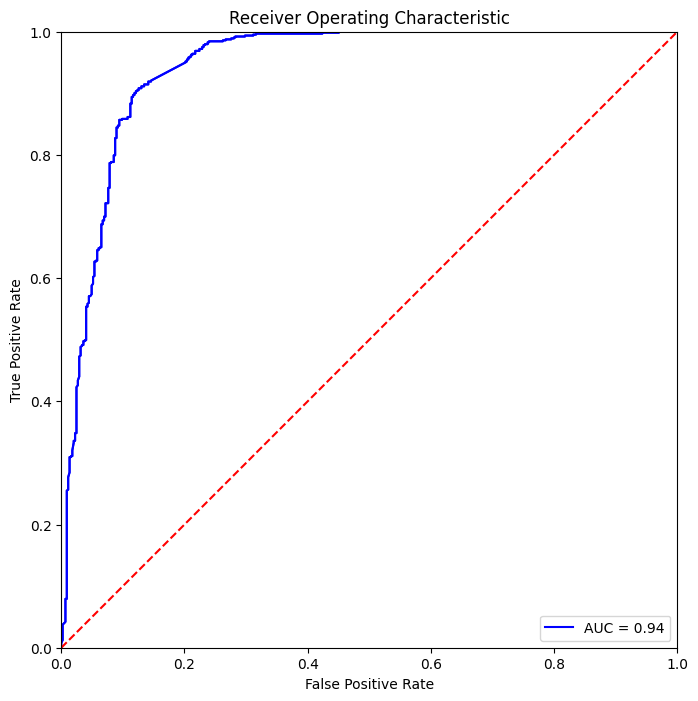

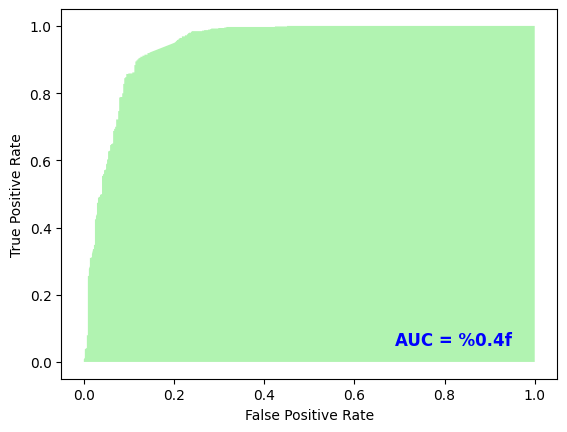

In [70]:

from sklearn import metrics
import sklearn.metrics as metrics
from pandas import*
# calculate the fpr and tpr for all thresholds of the classification
probs = xgb_tuned.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)
plt.figure(figsize=(10, 8), dpi=100)
plt.axis('scaled')

plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()
plt.fill_between(fpr, tpr, facecolor='lightgreen', alpha=0.7)
plt.text(0.95, 0.05, 'AUC = %0.4f' , ha='right', fontsize=12, weight='bold', color='blue')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.show()

<div class="alert alert-block alert-info">
<b>Feature importance for alternate model (Tuned XGBoost)</b>
</div>

In [71]:
print (pd.DataFrame(xgb_tuned.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))

                                             Imp
Curricular units 2nd sem (approved)     0.692961
Curricular units 1st sem (enrolled)     0.119294
Curricular units 1st sem (approved)     0.062695
Course                                  0.049884
Curricular units 2nd sem (grade)        0.041889
Curricular units 1st sem (evaluations)  0.033277
Tuition fees up to date                 0.000000


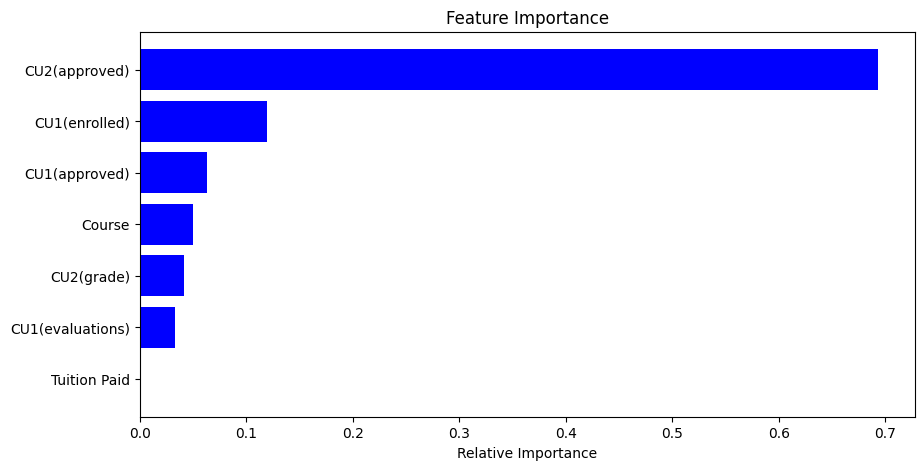

In [72]:
importances = xgb_tuned.feature_importances_
indices = np.argsort(importances)
feature_names=['Course','Tuition Paid','CU1(enrolled)','CU1(evaluations)','CU1(approved)','CU2(approved)','CU2(grade)']
plt.figure(figsize=(10,5))
plt.title('Feature Importance')
plt.barh(range(len(indices)), importances[indices], color='blue', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()


In [116]:
import pickle

with open('stack_model.pkl', 'wb') as model_file:
    pickle.dump(stack_model_3, model_file)

print("Model saved to 'stack_model.pkl'")


Model saved to 'stack_model.pkl'


In [133]:
@app.route('/predict', methods=['POST'])
def predict():
    # Get data from the POST request
    data = request.json  # Expecting JSON data
    print("Received data:", data)  # Debugging output

    # Extract index from the request data
    index = data.get('index')

    # Validate the index
    if index is None or index < 0 or index >= len(df):
        return jsonify({'error': 'Invalid index provided'}), 400

    # Extract features from the DataFrame
    try:
        features = np.array([
            df['Course'].iloc[index],  # Assuming 'Course' is categorical
            df['Tuition fees up to date'].iloc[index],
            df["Curricular units 1st sem (enrolled)"].iloc[index],
            df["Curricular units 1st sem (evaluations)"].iloc[index],
            df["Curricular units 1st sem (approved)"].iloc[index],
            df["Curricular units 2nd sem (approved)"].iloc[index],
            df["Curricular units 2nd sem (grade)"].iloc[index],
        ]).reshape(1, -1)  # Reshape for model input
    except Exception as e:
        return jsonify({'error': f'Feature extraction error: {str(e)}'}), 500

    # Make prediction
    try:
        prediction = model.predict(features)
    except Exception as e:
        return jsonify({'error': f'Prediction error: {str(e)}'}), 500
    
    # Return the prediction as JSON
    return jsonify({'prediction': int(prediction[0])})  # Convert to int


AssertionError: The setup method 'route' can no longer be called on the application. It has already handled its first request, any changes will not be applied consistently.
Make sure all imports, decorators, functions, etc. needed to set up the application are done before running it.

### <center> Thank You 